# Retrieval of Product GTIN/Lot information

In [36]:
from IPython.display import Image
import subprocess
import shlex

Blue Nespresso Coffee Pods | Black Nespresso Coffee Pods | Blue Lindt Chocolate | Black Godiva Chocolate
- | - | - | -
![alt](BlueBarcode.JPG) | ![alt](BlackBarcode.JPG) |  ![alt](2BlueBarcode.JPG)|  ![alt](2BlackBarLot.JPG) | 

In [34]:
process = subprocess.Popen(shlex.split('zbarimg 2BlueBarcode.JPG BlackBarcode.JPG BlueBarcode.JPG 2BlackBarLot.JPG'), stdout=subprocess.PIPE)
out, err = process.communicate()
print(out.decode())

EAN-13:0037466026916
EAN-13:7640154067257
EAN-13:7630039679972
EAN-13:0031290114962



## Image 1: Blue Nespresso Coffee Pods 

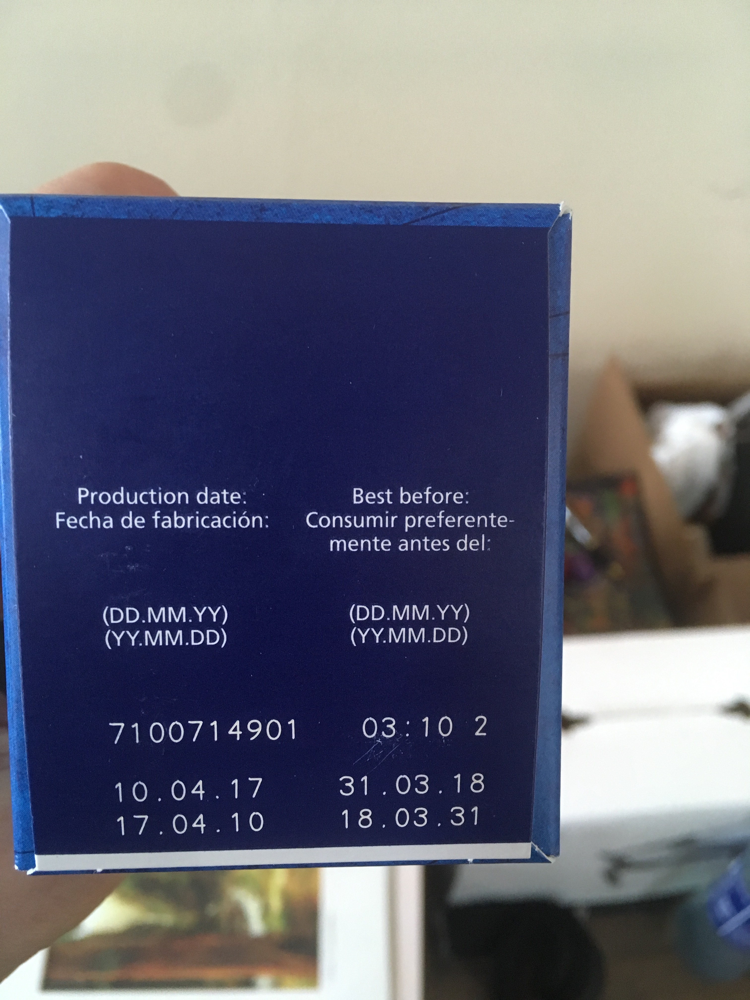

In [15]:
Image(filename='BlueLot.JPG', width=200) 

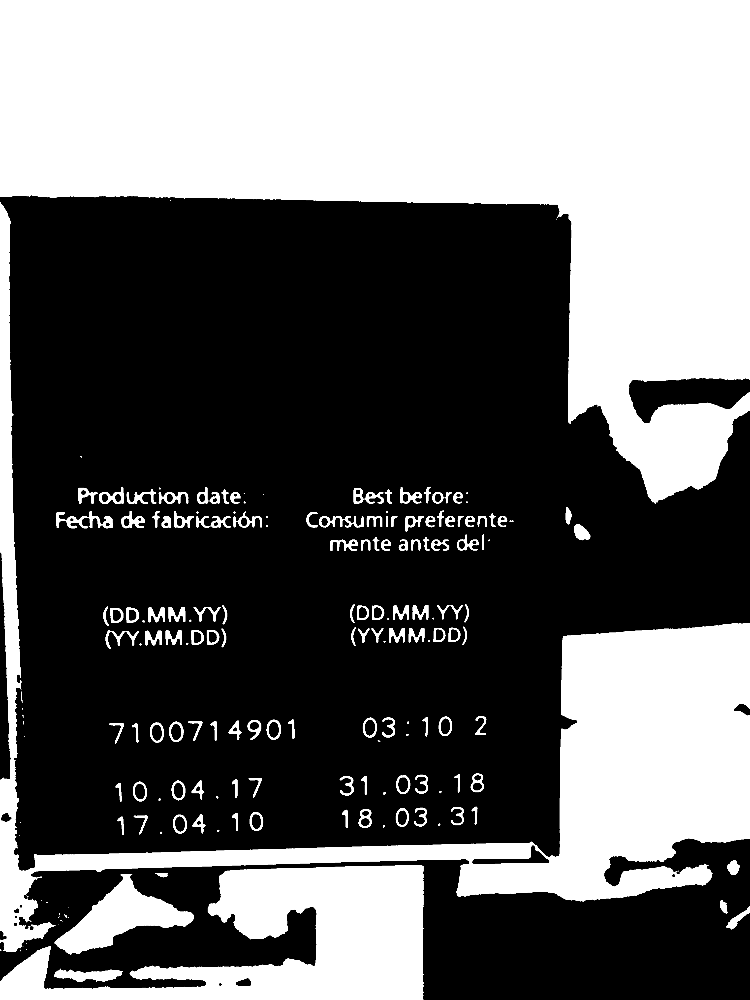

In [14]:
subprocess.call(shlex.split('convert BlueLot.JPG -blur 0x2 -colorspace gray -threshold 40% -type bilevel -morphology close disk:5  -contrast-stretch 15x0%%  -unsharp 0x3 result.png'))
Image(filename='result.png',width=200)

In [21]:
subprocess.call(shlex.split('tesseract result.png out --psm 11 --oem 2'))
process = subprocess.Popen(shlex.split('cat out.txt'), stdout=subprocess.PIPE)
out, err = process.communicate()
print("7100714901" in out.decode())

True


## Image 2: Black Nespresso Coffee Pods

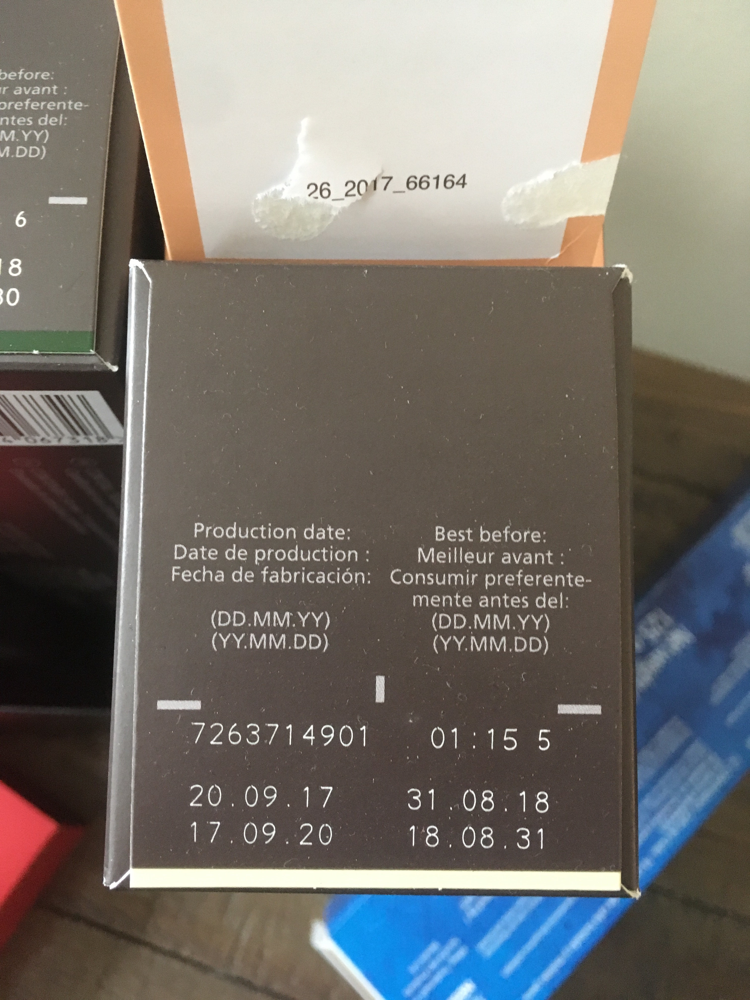

In [23]:
Image(filename='BlackLot.JPG', width=200) 

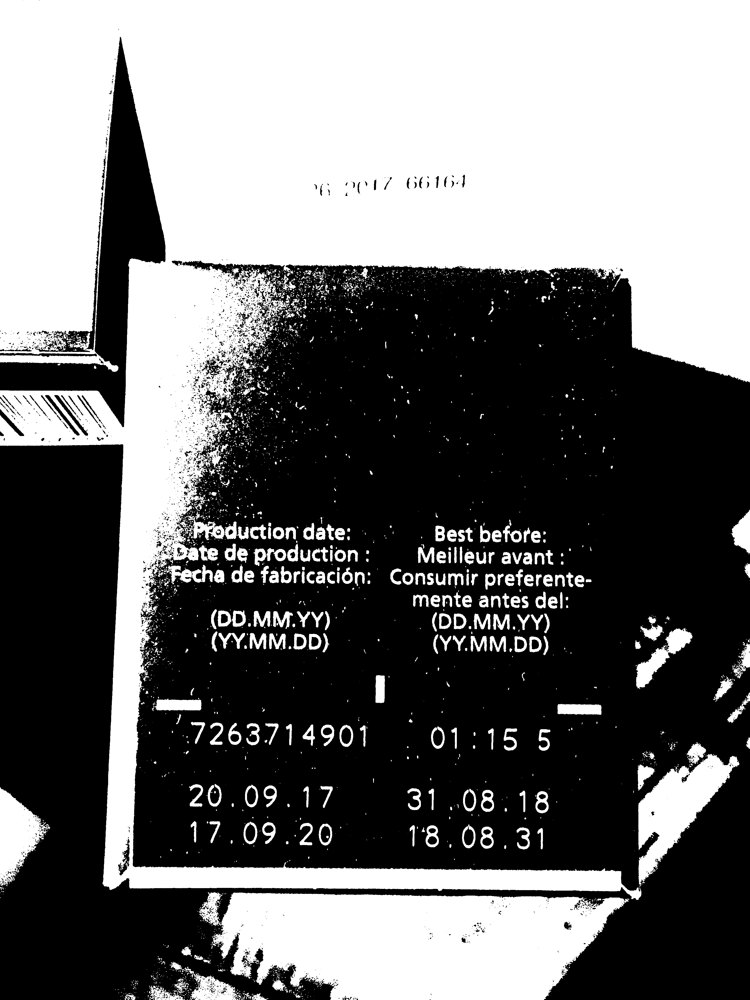

In [53]:
subprocess.call(shlex.split('convert BlackLot.JPG -blur 0x1 -colorspace gray -threshold 40% -uns result.png'))
Image(filename='result.png',width=200)

In [55]:
subprocess.call(shlex.split('tesseract result.png out --psm 11 --oem 2'))
process = subprocess.Popen(shlex.split('cat out.txt'), stdout=subprocess.PIPE)
out, err = process.communicate()
print("7263714901" in out.decode()) ## < It's being hardheaded and insisting the 7 is a 1 

False


## Image 3: Blue Lindt Chocolate

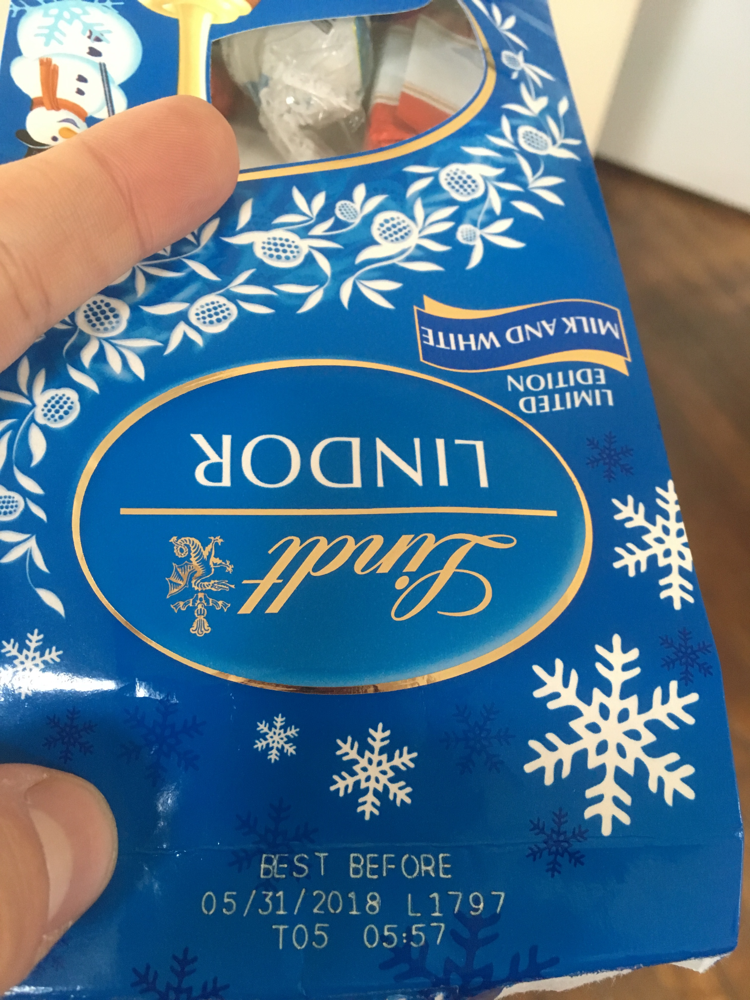

In [27]:
Image(filename='2BlueLot.JPG', width=200) 

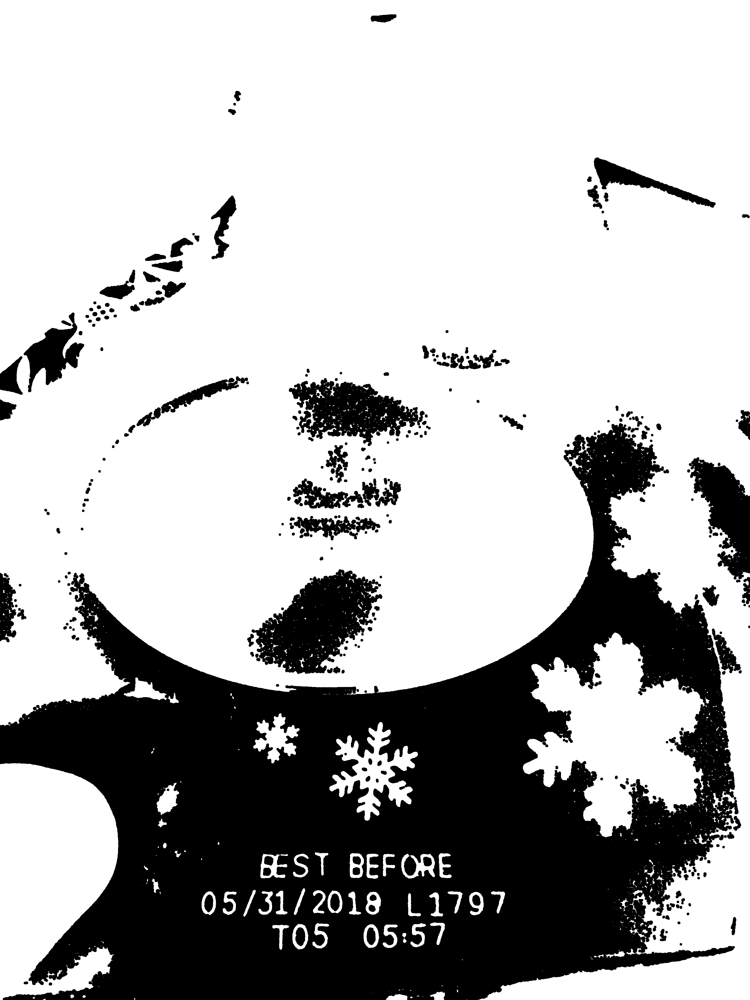

In [39]:
subprocess.call(shlex.split('convert 2BlueLot.JPG -blur 0x1 -colorspace gray -threshold 30% -type bilevel -morphology close disk:5  -contrast-stretch 15x0%%  -unsharp 0x3 result.png'))
Image(filename='result.png',width=200)

In [40]:
subprocess.call(shlex.split('tesseract result.png out --psm 11 --oem 2'))
process = subprocess.Popen(shlex.split('cat out.txt'), stdout=subprocess.PIPE)
out, err = process.communicate()
print("L1797" in out.decode())

True


## Image 4: Black Godiva Chocolate

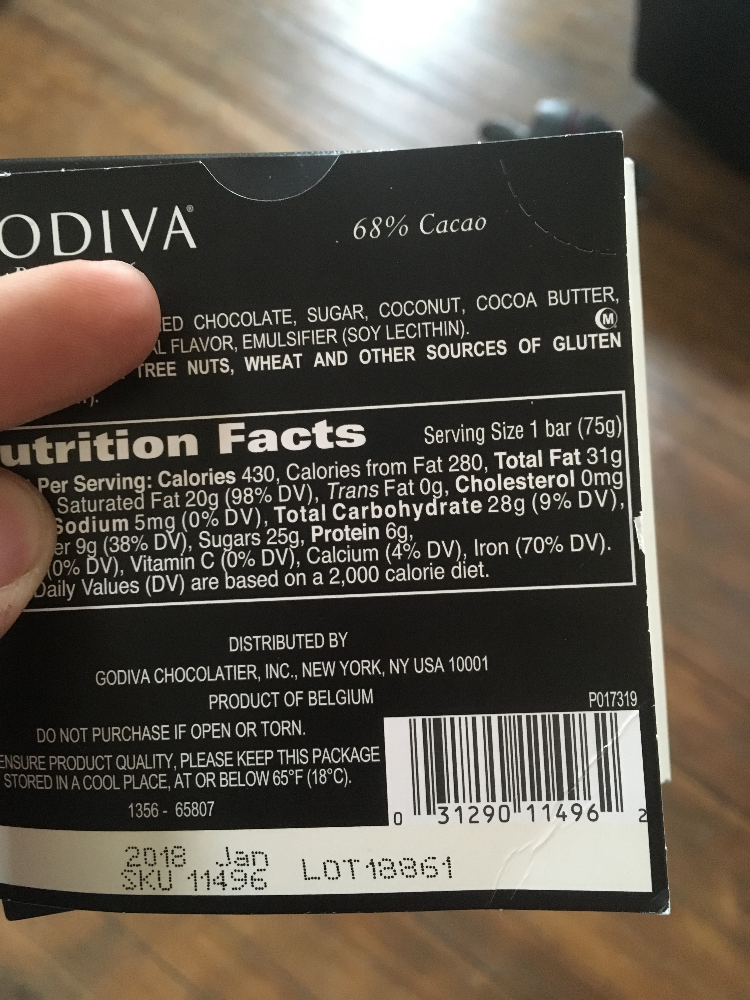

In [30]:
Image(filename='2BlackBarLot.JPG', width=200) 

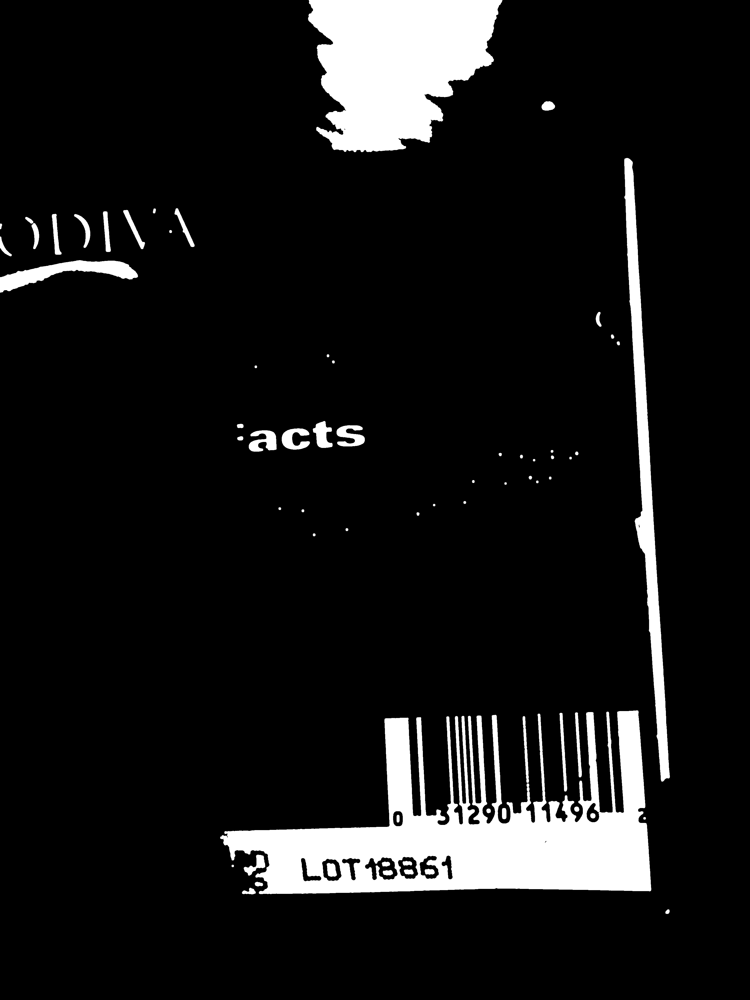

In [31]:
subprocess.call(shlex.split('convert 2BlackBarLot.JPG -blur 0x2 -colorspace gray -threshold 80%  -morphology open disk:5  -contrast-stretch 20x0%%  result.png'))
Image(filename='result.png',width=200)

In [37]:
subprocess.call(shlex.split('tesseract result.png out --psm 11 --oem 2'))
process = subprocess.Popen(shlex.split('cat out.txt'), stdout=subprocess.PIPE)
out, err = process.communicate()
print("LOT18861" in out.decode())

True
